In [1]:
#Importare il dataset
import pandas as pd

df = pd.read_csv('../Dataset/dfFinalCompetition2025.csv')

<Figure size 1400x800 with 0 Axes>

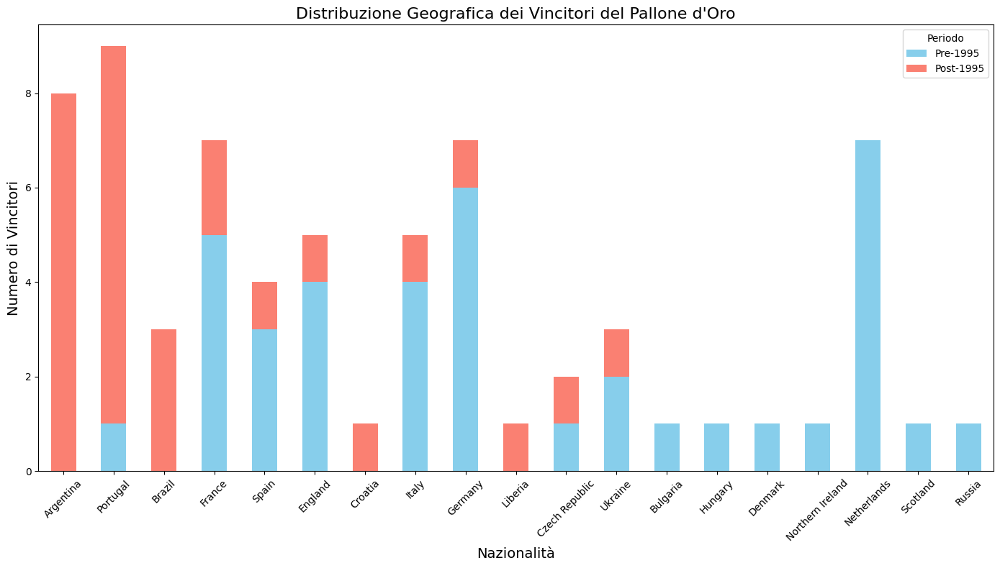

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filtrare i dati rilevanti: nazionalità dei vincitori in base agli anni e ai criteri di voto
pre_1995 = df[(df['year'] < 1995) & (df['rank'] == '1st')]
post_1995 = df[(df['year'] >= 1995) & (df['rank'] == '1st')]



# Calcolare il numero di vincitori per nazionalità prima e dopo il 1995
pre_1995_counts = pre_1995['nazionality'].value_counts()
post_1995_counts = post_1995['nazionality'].value_counts()

# Creare un unico dataframe per confronto
geographical_data = pd.DataFrame({
    'Pre-1995': pre_1995_counts,
    'Post-1995': post_1995_counts
}).fillna(0)

# Creazione del grafico
plt.figure(figsize=(14, 8))
geographical_data.sort_values(by='Post-1995', ascending=False).plot(
    kind='bar', stacked=True, figsize=(14, 8), color=['skyblue', 'salmon']
)
plt.title("Distribuzione Geografica dei Vincitori del Pallone d'Oro", fontsize=16)
plt.xlabel("Nazionalità", fontsize=14)
plt.ylabel("Numero di Vincitori", fontsize=14)
plt.legend(title="Periodo")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


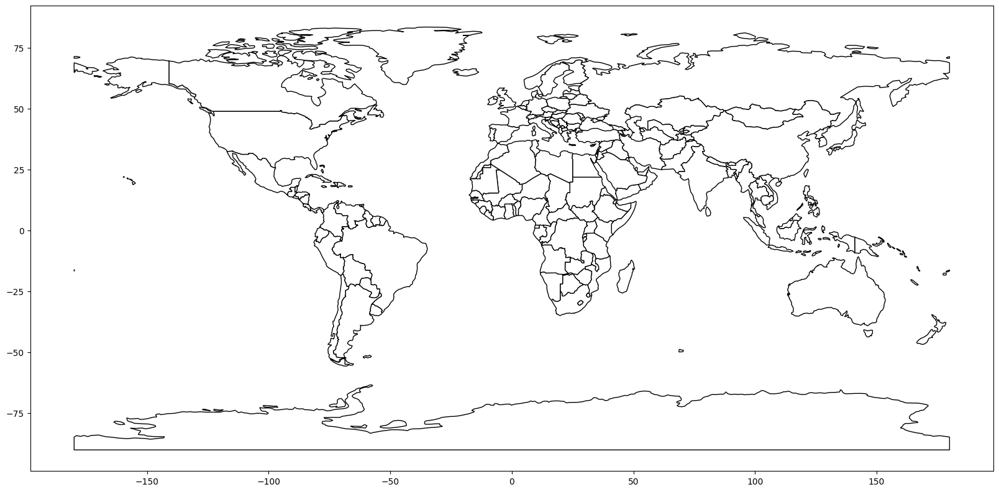

In [3]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Specifica il percorso del file .shp estratto
file_path = '../ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp'

# Carica i dati geografici del mondo
world = gpd.read_file(file_path)
world['color'] = '#FFFFFF'

#world  = world.dropna(subset=['ADMIN'])
# Crea la mappa con dimensioni personalizzate
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
world.boundary.plot(ax=ax, linewidth=0.005, color='black')  # Linea dei bordi sottile
world.plot(ax=ax, color=world['color'], edgecolor='black')
plt.show()

In [4]:
# Sostituisci con il percorso file REGNO UNITO
uk = gpd.read_file("../gadm41_GBR_1.json/gadm41_GBR_1.json" )  
uk.loc[uk['NAME_1'] == 'NorthernIreland', 'NAME_1'] = 'Northern Ireland'
uk.loc[uk['NAME_1'] == 'NA', 'NAME_1'] = 'England'
uk = uk.drop(uk.index[-1])

In [5]:
import pandas as pd
import numpy as np

#Paesi Europei
european_countries = [
    "Albania", "Andorra", "Armenia", "Austria", "Azerbaijan", "Belarus", "Belgium",
    "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Cyprus", "Czech Republic",
    "Denmark", "Estonia", "Finland", "France", "Georgia", "Germany", "Greece",
    "Hungary", "Iceland", "Ireland", "Italy", "Kazakhstan", "Kosovo", "Latvia",
    "Liechtenstein", "Lithuania", "Luxembourg", "Malta", "Moldova", "Monaco",
    "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
    "Portugal", "Romania", "Russia", "San Marino", "Serbia", "Slovakia",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Turkey", "Ukraine",
    "Wales","Ireland", "Vatican City"
]


dfStati = df[['year','rank','nazionality']]
df_pre1995 =  dfStati[(dfStati['year'] < 1995) & (dfStati['rank'] == '1st')]
df_post1995 = dfStati[(dfStati['year'] >= 1995) & (dfStati['rank'] == '1st')]
#creo i df specifici
stati_unici_pre = df_pre1995['nazionality'].unique()
stati_unici_post = df_post1995 ['nazionality'].unique()
#creo le liste
list_Stati_pre = [{'ADMIN': stato, 'Numero': (df_pre1995['nazionality'] == stato).sum()} for stato in stati_unici_pre]
list_Stati_post = [{'ADMIN': stato, 'Numero': (df_post1995['nazionality'] == stato).sum()} for stato in stati_unici_post]

# Aggiungo i paesi mancanti con 0 occorrenze
for country in european_countries:
    if country not in stati_unici_pre:
        list_Stati_pre.append({'ADMIN': country, 'Numero': np.int64(0)})

print(list_Stati_pre)
print(list_Stati_post)



[{'ADMIN': 'England', 'Numero': np.int64(4)}, {'ADMIN': 'Spain', 'Numero': np.int64(3)}, {'ADMIN': 'France', 'Numero': np.int64(5)}, {'ADMIN': 'Italy', 'Numero': np.int64(4)}, {'ADMIN': 'Czech Republic', 'Numero': np.int64(1)}, {'ADMIN': 'Russia', 'Numero': np.int64(1)}, {'ADMIN': 'Scotland', 'Numero': np.int64(1)}, {'ADMIN': 'Portugal', 'Numero': np.int64(1)}, {'ADMIN': 'Hungary', 'Numero': np.int64(1)}, {'ADMIN': 'Northern Ireland', 'Numero': np.int64(1)}, {'ADMIN': 'Germany', 'Numero': np.int64(6)}, {'ADMIN': 'Netherlands', 'Numero': np.int64(7)}, {'ADMIN': 'Ukraine', 'Numero': np.int64(2)}, {'ADMIN': 'Denmark', 'Numero': np.int64(1)}, {'ADMIN': 'Bulgaria', 'Numero': np.int64(1)}, {'ADMIN': 'Albania', 'Numero': np.int64(0)}, {'ADMIN': 'Andorra', 'Numero': np.int64(0)}, {'ADMIN': 'Armenia', 'Numero': np.int64(0)}, {'ADMIN': 'Austria', 'Numero': np.int64(0)}, {'ADMIN': 'Azerbaijan', 'Numero': np.int64(0)}, {'ADMIN': 'Belarus', 'Numero': np.int64(0)}, {'ADMIN': 'Belgium', 'Numero': np.

In [6]:
#mondo POST 1995

C:\Users\matti\AppData\Local\Temp\ipykernel_9920\3841410636.py:32: UserWarning: `keep_geom_type=True` in overlay resulted in 2205 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  combined_gdf = gpd.overlay(combined_gdf, bbox, how='intersection')


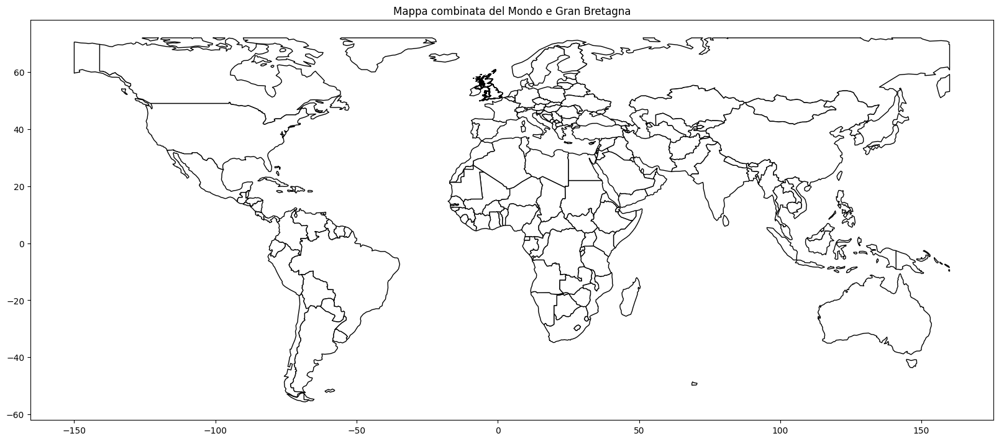

In [7]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import box
import pandas as pd

# Carica il file del mondo (dataset incluso in GeoPandas)
world = gpd.read_file('../ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp')

# Carica il file della Gran Bretagna (devi sostituire con il percorso del tuo file shapefile o GeoJSON)
# Supponiamo che tu abbia un file shapefile o GeoJSON che contiene la mappa della Gran Bretagna
uk = gpd.read_file("../gadm41_GBR_1.json/gadm41_GBR_1.json" )  # Sostituisci con il percorso del tuo file

# Verifica e allinea i CRS (Coordinate Reference System) tra la mappa del mondo e la mappa della Gran Bretagna
if world.crs != uk.crs:
    uk = uk.to_crs(world.crs)  # Allinea il CRS della Gran Bretagna a quello del mondo

# Unisci i due GeoDataFrame (mappa del mondo con la Gran Bretagna)
combined_gdf = pd.concat([world, uk], ignore_index=True)
combined_gdf['color'] = '#FFFFFF'

combined_gdf.loc[combined_gdf['NAME_1'] == 'Wales', 'ADMIN'] = combined_gdf.loc[combined_gdf['NAME_1'] == 'Wales', 'NAME_1']
combined_gdf.loc[combined_gdf['NAME_1'] == 'Scotland', 'ADMIN'] = combined_gdf.loc[combined_gdf['NAME_1'] == 'Scotland', 'NAME_1']
combined_gdf.loc[combined_gdf['NAME_1'] == 'NorthernIreland', 'ADMIN'] = combined_gdf.loc[combined_gdf['NAME_1'] == 'NorthernIreland', 'NAME_1']
combined_gdf.loc[(combined_gdf['ADMIN'].isna()) & (combined_gdf['COUNTRY'] == 'UnitedKingdom'), 'ADMIN'] = 'England'
combined_gdf['ADMIN'] = combined_gdf['ADMIN'].replace('NorthernIreland', 'Northern Ireland')

# Definiamo un bounding box approssimativo per la parte europea
minx, miny, maxx, maxy = -150.0, -60.0, 160.0, 72.0
bbox = gpd.GeoDataFrame({'geometry': [box(minx, miny, maxx, maxy)]}, crs=combined_gdf.crs)

# bounding box
combined_gdf = gpd.overlay(combined_gdf, bbox, how='intersection')

# Visualizza la mappa combinata
fig, ax = plt.subplots(figsize=(20, 10))  # Imposta la dimensione della mappa
combined_gdf.boundary.plot(ax=ax, linewidth=0.005, color='black')  # Linea dei bordi sottile
combined_gdf.plot(ax=ax, color=combined_gdf['color'], edgecolor='black')
plt.title("Mappa combinata del Mondo e Gran Bretagna")
plt.show()

output_file_path = 'worldSummary.geojson'
combined_gdf.to_file(output_file_path, driver='GeoJSON')

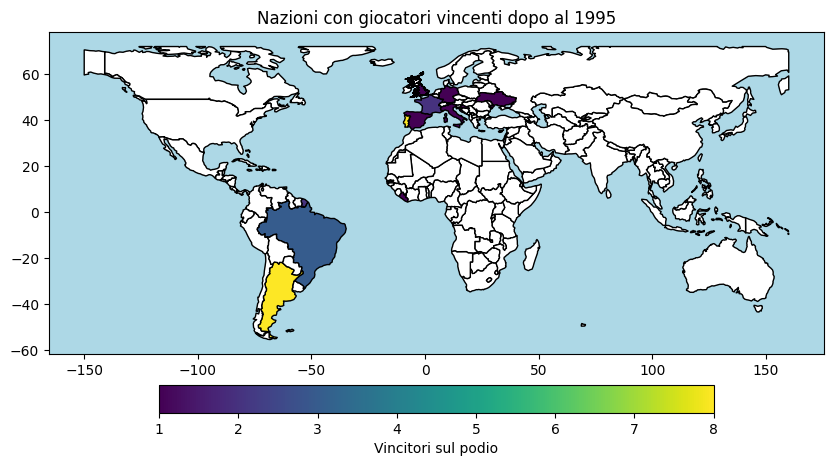

In [8]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as mcolors

occurrences_df = pd.DataFrame(list_Stati_post)

# Unire i dati delle occorrenze con il DataFrame geografico
combined_gdf = combined_gdf.merge(occurrences_df, how='left', on='ADMIN')

# Definire una mappa di colori graduale
cmap = plt.cm.viridis

# Normalizzare i valori delle occorrenze per la mappa di colori
norm = mcolors.Normalize(vmin=combined_gdf['Numero'].min(), vmax=combined_gdf['Numero'].max())

# Applicare la mappa di colori ai valori delle occorrenze e impostare gli stati senza occorrenze a bianco
combined_gdf['color'] = combined_gdf['Numero'].apply(lambda x: mcolors.to_hex(cmap(norm(x))) if x > 0 else '#FFFFFF')

# Crea la mappa con i colori specificati e bordi neri con una linea sottile
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
combined_gdf.boundary.plot(ax=ax, linewidth=0.1, color='black')  # Linea dei bordi sottile
combined_gdf.plot(ax=ax, color=combined_gdf['color'], edgecolor='black')

# Aggiungere la legenda manualmente
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.036, pad=0.04)
cbar.set_label('Vincitori sul podio')
ax.set_title('Nazioni con giocatori vincenti dopo al 1995')
ax.set_facecolor('#ADD8E6')  # Imposta il colore di sfondo a azzurrino chiaro

#Salva Immagine grafico
fig.savefig("../Grafici/immagini/mappaMondiale.pdf", dpi=600)
# Mostra la mappa
plt.show()
plt.close()

# Salva il GeoDataFrame modificato in un nuovo file GeoJSON
output_file_path = 'world_post1995.geojson'
#combined_gdf.to_file(output_file_path, driver='GeoJSON')

In [9]:
#EUROPA 1995

C:\Users\matti\AppData\Local\Temp\ipykernel_9920\775350636.py:27: UserWarning: `keep_geom_type=True` in overlay resulted in 2205 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  europa_github = gpd.overlay(europa_github, bbox, how='intersection')


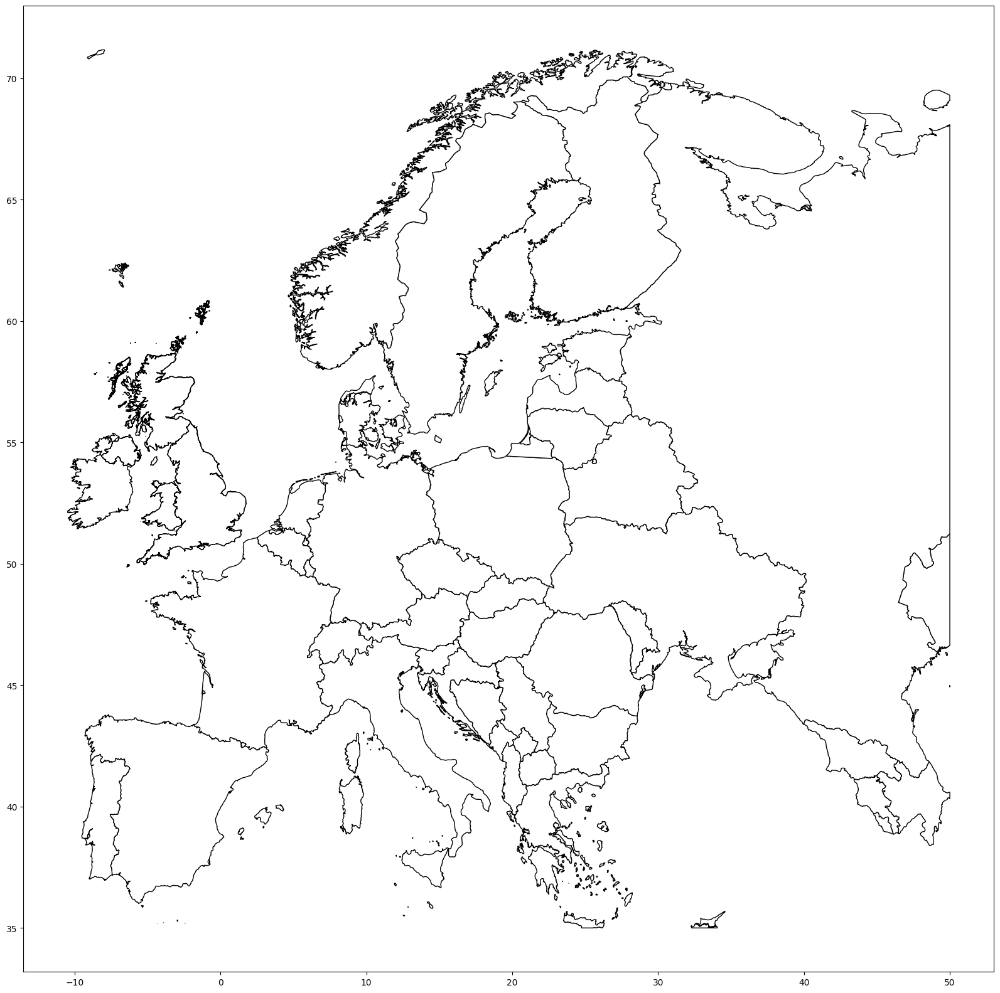

In [10]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import box

# Specifica il percorso del file .shp estratto
file_path_github = '../countries.geojson'

# Carica i dati geografici del mondo
europa_github = gpd.read_file(file_path_github)

europa_github = pd.concat([europa_github, uk], ignore_index=True)
# Unisci i due GeoDataFrame (mappa del mondo con la Gran Bretagna)
europa_github.loc[europa_github['NAME_1'] == 'Wales', 'ADMIN'] = europa_github.loc[europa_github['NAME_1'] == 'Wales', 'NAME_1']
europa_github.loc[europa_github['NAME_1'] == 'Scotland', 'ADMIN'] = europa_github.loc[europa_github['NAME_1'] == 'Scotland', 'NAME_1']
europa_github.loc[europa_github['NAME_1'] == 'NorthernIreland', 'ADMIN'] = europa_github.loc[europa_github['NAME_1'] == 'NorthernIreland', 'NAME_1']
europa_github.loc[(europa_github['ADMIN'].isna()) & (europa_github['COUNTRY'] == 'UnitedKingdom'), 'ADMIN'] = 'England'
europa_github['ADMIN'] = europa_github['ADMIN'].replace('NorthernIreland', 'Northern Ireland')

europa_github['color'] = '#FFFFFF'


# Definiamo un bounding box approssimativo per la parte europea
minx, miny, maxx, maxy = -12.0, 35.0, 50.0, 72.0
bbox = gpd.GeoDataFrame({'geometry': [box(minx, miny, maxx, maxy)]}, crs=europa_github.crs)

# bounding box
europa_github = gpd.overlay(europa_github, bbox, how='intersection')

# Stati da eliminare
states_to_remove = ['Morocco', 'Algeria', 'Tunisia', 'Turkey', 'Syria', 'Iraq', 'Iran']
europa_github = europa_github.drop(europa_github[europa_github['ADMIN'].isin(states_to_remove)].index)

# Imposta il colore grigio chiaro per gli stati specificati
#states_to_color = ['Morocco', 'Algeria', 'Tunisia', 'Turkey', 'Syria', 'Iraq', 'Iran']
#europa_github.loc[europa_github['ADMIN'].isin(states_to_color), 'color'] = '#D3D3D3'

# Crea la mappa con dimensioni personalizzate
fig, ax = plt.subplots(1, 1, figsize=(30, 20))
europa_github.boundary.plot(ax=ax, linewidth=0.005, color='black')  # Linea dei bordi sottile
europa_github.plot(ax=ax, color=europa_github['color'], edgecolor='black')

#ax.set_facecolor('#f0f8ff')  # Imposta il colore di sfondo a azzurrino chiaro
ax.set_facecolor('white')  # Imposta il colore di sfondo a azzurrino chiaro
plt.show()

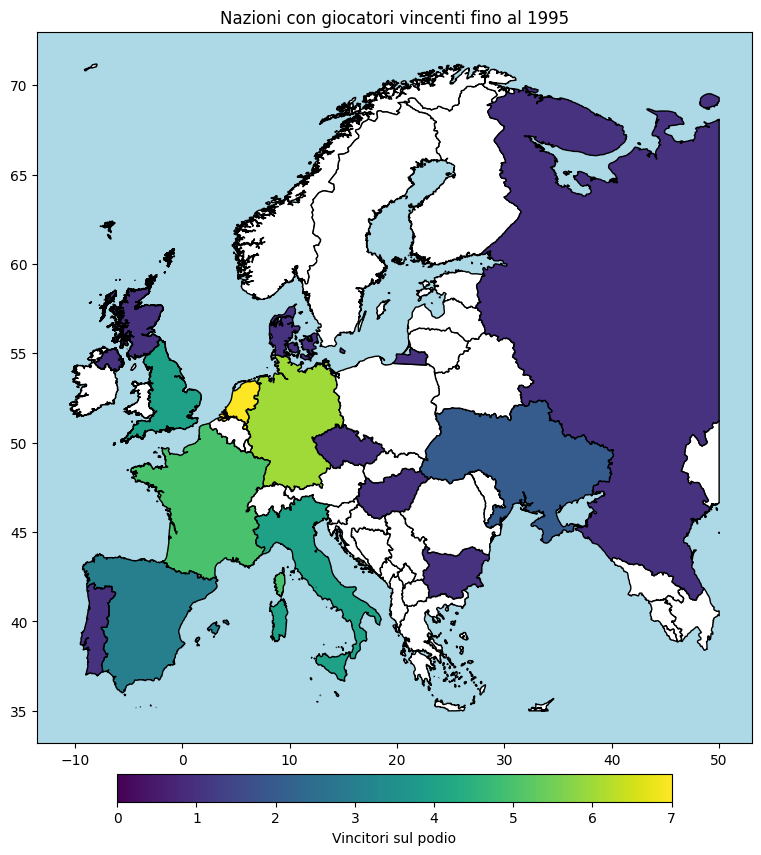

In [11]:
import pandas as pd
import matplotlib.colors as mcolors

occurrences_df = pd.DataFrame(list_Stati_pre)

# Unire i dati delle occorrenze con il DataFrame geografico
europa_github = europa_github.merge(occurrences_df, how='left', on='ADMIN')

# Riempire i valori NaN con 0 (nessuna occorrenza)
europa_github['Numero'] = europa_github['Numero'].fillna(0)

# Definire una mappa di colori graduale
cmap = plt.cm.viridis

# Normalizzare i valori delle occorrenze per la mappa di colori
norm = mcolors.Normalize(vmin=europa_github['Numero'].min(), vmax=europa_github['Numero'].max())

# Applicare la mappa di colori ai valori delle occorrenze e impostare gli stati senza occorrenze a bianco
europa_github['color'] = europa_github['Numero'].apply(lambda x: mcolors.to_hex(cmap(norm(x))) if x > 0 else '#FFFFFF')

# Imposta il colore grigio chiaro per gli stati specificati
states_to_color = ['Morocco', 'Algeria', 'Tunisia', 'Turkey', 'Syria', 'Iraq', 'Iran']
europa_github.loc[europa_github['ADMIN'].isin(states_to_color), 'color'] = '#D3D3D3'


# Crea la mappa con i colori specificati e bordi neri con una linea sottile
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
europa_github.boundary.plot(ax=ax, linewidth=0.1, color='black')  # Linea dei bordi sottile
europa_github.plot(ax=ax, color=europa_github['color'], edgecolor='black')

# Aggiungere la legenda manualmente
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.036, pad=0.04)
cbar.set_label('Vincitori sul podio')
ax.set_title('Nazioni con giocatori vincenti fino al 1995')
ax.set_facecolor('#ADD8E6')  # Imposta il colore di sfondo a azzurrino chiaro


#Salva immagine grafico, salvo prima perche .show() svuota la figura dopo la visualizzazione.
plt.savefig("../Grafici/immagini/mappaEuropa1995.pdf", dpi=600)
# Mostra la mappa
plt.show()

# Salva il GeoDataFrame modificato in un nuovo file GeoJSON
output_file_path = 'world_pre1995.geojson'
#europa_github.to_file(output_file_path, driver='GeoJSON')

In [12]:
####


In [13]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as mcolors

european_countries = [
    "Albania", "Andorra", "Armenia", "Austria", "Azerbaijan", "Belarus", "Belgium",
    "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Cyprus", "Czech Republic",
    "Denmark", "Estonia", "Finland", "France", "Georgia", "Germany", "Greece",
    "Hungary", "Iceland", "Ireland", "Italy", "Kazakhstan", "Kosovo", "Latvia",
    "Liechtenstein", "Lithuania", "Luxembourg", "Malta", "Moldova", "Monaco",
    "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
    "Portugal", "Romania", "Russia", "San Marino", "Serbia", "Slovakia",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Turkey", "Ukraine",
    "Wales","Ireland", "Vatican City"
]

dfStati = df[['year','rank','nazionality']]
df_stati1 = dfStati[dfStati['rank'] == '1st']
df_stati2 = df_stati1['nazionality'].unique()
list_Stati= [{'ADMIN': stato, 'Numero': (df_stati1['nazionality'] == stato).sum()} for stato in df_stati2]

'''
for country in european_countries:
    if country not in list_Stati:
        list_Stati.append({'ADMIN': country, 'Numero': np.int64(0)})
'''
print(list_Stati)

occurrences_df = pd.DataFrame(list_Stati)

# Unire i dati delle occorrenze con il DataFrame geografico
combined_gdf = combined_gdf.merge(occurrences_df, how='left', on='ADMIN')

# Definire una mappa di colori graduale
cmap = plt.colormaps['YlOrBr']

# Normalizzare i valori delle occorrenze per la mappa di colori
norm = mcolors.Normalize(vmin=combined_gdf['Numero'].min(), vmax=combined_gdf['Numero'].max())

# Applicare la mappa di colori ai valori delle occorrenze e impostare gli stati senza occorrenze a bianco
combined_gdf['color'] = combined_gdf['Numero'].apply(lambda x: mcolors.to_hex(cmap(norm(x))) if x > 0 else '#FFFFFF')

# Crea la mappa con i colori specificati e bordi neri con una linea sottile
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
combined_gdf.boundary.plot(ax=ax, linewidth=0.1, color='black')  # Linea dei bordi sottile
combined_gdf.plot(ax=ax, color=combined_gdf['color'], edgecolor='black')

# Aggiungere la legenda manualmente
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.036, pad=0.04)
cbar.set_label('Numero di vincitori')
ax.set_title('Nazioni con giocatori vincenti')
ax.set_facecolor('#ADD8E6')  # Imposta il colore di sfondo a azzurrino chiaro

#Salva Immagine grafico
#fig.savefig("../Grafici/immagini/mappaMondiale.pdf", dpi=600)
# Mostra la mappa
plt.show()
plt.close()

# Salva il GeoDataFrame modificato in un nuovo file GeoJSON
#output_file_path = 'world_post1995.geojson'
#combined_gdf.to_file(output_file_path, driver='GeoJSON')

[{'ADMIN': 'England', 'Numero': np.int64(5)}, {'ADMIN': 'Spain', 'Numero': np.int64(4)}, {'ADMIN': 'France', 'Numero': np.int64(7)}, {'ADMIN': 'Italy', 'Numero': np.int64(5)}, {'ADMIN': 'Czech Republic', 'Numero': np.int64(2)}, {'ADMIN': 'Russia', 'Numero': np.int64(1)}, {'ADMIN': 'Scotland', 'Numero': np.int64(1)}, {'ADMIN': 'Portugal', 'Numero': np.int64(9)}, {'ADMIN': 'Hungary', 'Numero': np.int64(1)}, {'ADMIN': 'Northern Ireland', 'Numero': np.int64(1)}, {'ADMIN': 'Germany', 'Numero': np.int64(7)}, {'ADMIN': 'Netherlands', 'Numero': np.int64(7)}, {'ADMIN': 'Ukraine', 'Numero': np.int64(3)}, {'ADMIN': 'Denmark', 'Numero': np.int64(1)}, {'ADMIN': 'Bulgaria', 'Numero': np.int64(1)}, {'ADMIN': 'Liberia', 'Numero': np.int64(1)}, {'ADMIN': 'Brazil', 'Numero': np.int64(3)}, {'ADMIN': 'Argentina', 'Numero': np.int64(8)}, {'ADMIN': 'Croatia', 'Numero': np.int64(1)}]


KeyError: 'Numero'

C:\Users\matti\AppData\Local\Temp\ipykernel_9920\846300161.py:51: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  combined_gdf = pd.concat([combined_gdf, pd.DataFrame([{'ADMIN': c, 'geometry': None, 'Numero': 0}])],
C:\Users\matti\AppData\Local\Temp\ipykernel_9920\846300161.py:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('YlOrBr')


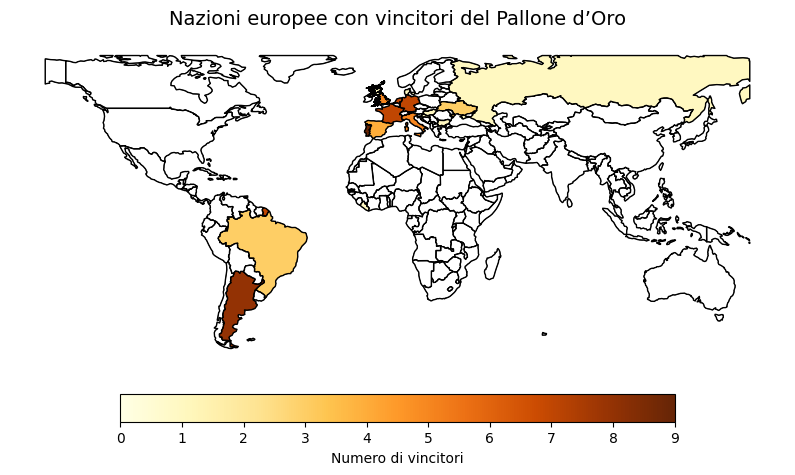

In [17]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ---------- DATI DELLE VITTORIE ----------
# df deve contenere almeno: year, rank, nazionality
# qui ipotizzo che tu lo abbia già caricato in memoria
# Esempio minimo per provare:
# data = {'year':[2023,2022,2021], 'rank':['1st','1st','1st'], 'nazionality':['Argentina','France','Portugal']}
# df = pd.DataFrame(data)

# Calcola quante volte ogni nazione ha vinto
df_vittorie = (
    df[df['rank'] == '1st']
    .groupby('nazionality')
    .size()
    .reset_index(name='Numero')
    .rename(columns={'nazionality': 'ADMIN'})
)

import geopandas as gpd


# ---------- SHAPEFILE / GEODATAFRAME ----------
combined_gdf = gpd.read_file('../Grafici/worldSummary.geojson')
combined_gdf = combined_gdf[['ADMIN', 'geometry']]

# ---------- UNIONI E VALORI MANCANTI ----------
combined_gdf = combined_gdf.merge(df_vittorie, how='left', on='ADMIN')
combined_gdf['Numero'] = combined_gdf['Numero'].fillna(0).astype(int)

# ---------- PAESI EUROPEI NON IN DF_VITTORIE ----------
# (opzionale, ma utile se vuoi proprio avere tutti a zero quando mancano)
european_countries = {
    "Albania", "Andorra", "Armenia", "Austria", "Azerbaijan", "Belarus", "Belgium",
    "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Cyprus", "Czech Republic",
    "Denmark", "Estonia", "Finland", "France", "Georgia", "Germany", "Greece",
    "Hungary", "Iceland", "Ireland", "Italy", "Kazakhstan", "Kosovo", "Latvia",
    "Liechtenstein", "Lithuania", "Luxembourg", "Malta", "Moldova", "Monaco",
    "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
    "Portugal", "Romania", "Russia", "San Marino", "Serbia", "Slovakia",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Turkey", "Ukraine",
    "Wales", "Vatican City"
}

presenti = set(combined_gdf['ADMIN'])
mancanti = european_countries - presenti
for c in mancanti:
    combined_gdf = pd.concat([combined_gdf, pd.DataFrame([{'ADMIN': c, 'geometry': None, 'Numero': 0}])],
                             ignore_index=True)

# ---------- COLORI ----------
cmap = plt.cm.get_cmap('YlOrBr')
# se tutti zero evito divisione per zero
vmin, vmax = combined_gdf['Numero'].min(), combined_gdf['Numero'].max()
if vmax == 0:
    vmax = 1
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

def get_hex(v):
    return '#FFFFFF' if v == 0 else mcolors.to_hex(cmap(norm(v)))

combined_gdf['color'] = combined_gdf['Numero'].apply(get_hex)

# ---------- PLOT ----------
fig, ax = plt.subplots(figsize=(10, 10))
combined_gdf.boundary.plot(ax=ax, linewidth=0.4, color='black')
combined_gdf.dropna(subset=['geometry']).plot(ax=ax,
                                              color=combined_gdf.dropna(subset=['geometry'])['color'],
                                              edgecolor='black')
ax.set_title('Nazioni europee con vincitori del Pallone d’Oro', fontsize=14, pad=12)
ax.set_facecolor('#ADD8E6')  # sfondo azzurro
ax.grid(True, linestyle='--', linewidth=0.4, alpha=0.6)

# leggenda
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='horizontal', fraction=0.036, pad=0.04)
cbar.set_label('Numero di vincitori')

plt.axis('off')
plt.show()


C:\Users\matti\AppData\Local\Temp\ipykernel_9920\540273914.py:47: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  combined_gdf = pd.concat([combined_gdf, pd.DataFrame([{'ADMIN': c, 'geometry': None, 'Numero': 0}])],
C:\Users\matti\AppData\Local\Temp\ipykernel_9920\540273914.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('YlOrBr')


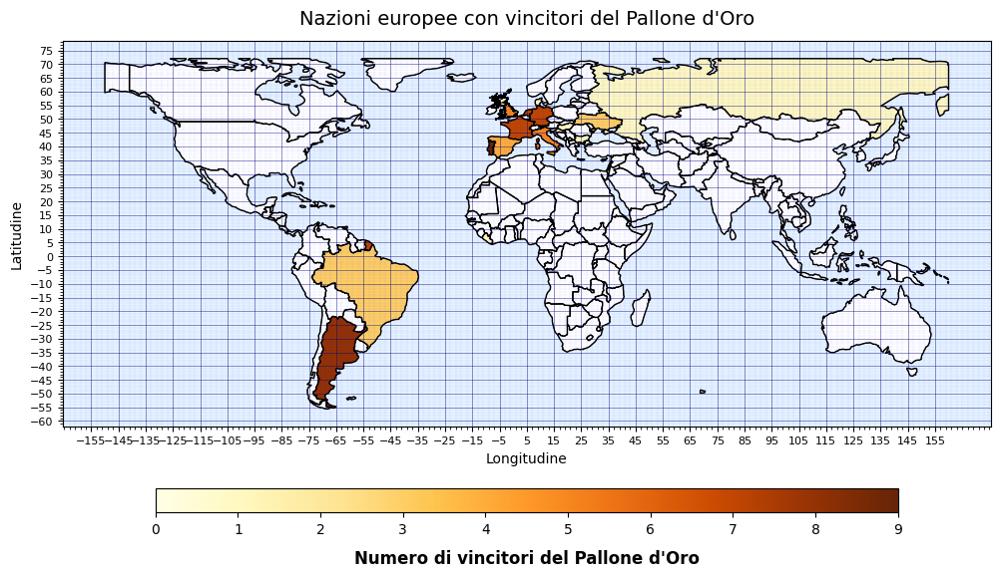

In [27]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ---------- DATI DELLE VITTORIE ----------
# df deve contenere almeno: year, rank, nazionality
# qui ipotizzo che tu lo abbia già caricato in memoria
# Esempio minimo per provare:
# data = {'year':[2023,2022,2021], 'rank':['1st','1st','1st'], 'nazionality':['Argentina','France','Portugal']}
# df = pd.DataFrame(data)

# Calcola quante volte ogni nazione ha vinto
df_vittorie = (
    df[df['rank'] == '1st']
    .groupby('nazionality')
    .size()
    .reset_index(name='Numero')
    .rename(columns={'nazionality': 'ADMIN'})
)

# ---------- SHAPEFILE / GEODATAFRAME ----------
combined_gdf = gpd.read_file('../Grafici/worldSummary.geojson')
combined_gdf = combined_gdf[['ADMIN', 'geometry']]

# ---------- UNIONI E VALORI MANCANTI ----------
combined_gdf = combined_gdf.merge(df_vittorie, how='left', on='ADMIN')
combined_gdf['Numero'] = combined_gdf['Numero'].fillna(0).astype(int)

# ---------- PAESI EUROPEI NON IN DF_VITTORIE ----------
european_countries = {
    "Albania", "Andorra", "Armenia", "Austria", "Azerbaijan", "Belarus", "Belgium",
    "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Cyprus", "Czech Republic",
    "Denmark", "Estonia", "Finland", "France", "Georgia", "Germany", "Greece",
    "Hungary", "Iceland", "Ireland", "Italy", "Kazakhstan", "Kosovo", "Latvia",
    "Liechtenstein", "Lithuania", "Luxembourg", "Malta", "Moldova", "Monaco",
    "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland",
    "Portugal", "Romania", "Russia", "San Marino", "Serbia", "Slovakia",
    "Slovenia", "Spain", "Sweden", "Switzerland", "Turkey", "Ukraine",
    "Wales", "Vatican City"
}

presenti = set(combined_gdf['ADMIN'])
mancanti = european_countries - presenti
for c in mancanti:
    combined_gdf = pd.concat([combined_gdf, pd.DataFrame([{'ADMIN': c, 'geometry': None, 'Numero': 0}])],
                             ignore_index=True)

# ---------- COLORI ----------
cmap = plt.cm.get_cmap('YlOrBr')
vmin, vmax = combined_gdf['Numero'].min(), combined_gdf['Numero'].max()
if vmax == 0:
    vmax = 1
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

def get_hex(v):
    return '#FFFFFF' if v == 0 else mcolors.to_hex(cmap(norm(v)))

combined_gdf['color'] = combined_gdf['Numero'].apply(get_hex)

# ---------- PLOT ----------
fig, ax = plt.subplots(figsize=(12, 10))

# Plot dei confini e delle aree colorate
combined_gdf.boundary.plot(ax=ax, linewidth=0.4, color='black')
combined_gdf.dropna(subset=['geometry']).plot(ax=ax,
                                              color=combined_gdf.dropna(subset=['geometry'])['color'],
                                              edgecolor='black')

# ---------- GRIGLIA ----------
# Opzione 1: Griglia di coordinate geografiche
ax.grid(True, linestyle='--', linewidth=0.8, alpha=0.7, color='darkblue')
ax.set_xlabel('Longitudine', fontsize=10)
ax.set_ylabel('Latitudine', fontsize=10)

bounds = combined_gdf.dropna(subset=['geometry']).total_bounds
minx, miny, maxx, maxy = bounds

# Crea tick personalizzati
lon_ticks = np.arange(int(minx)-5, int(maxx)+5, 10)  # ogni 10 gradi
lat_ticks = np.arange(int(miny)-5, int(maxy)+5, 5)   # ogni 5 gradi

ax.set_xticks(lon_ticks)
ax.set_yticks(lat_ticks)
ax.tick_params(axis='both', labelsize=8)

# Opzione 3: Griglia più fine con stile diverso
ax.grid(True, which='major', linestyle='-', linewidth=0.6, alpha=0.5, color='navy')
ax.grid(True, which='minor', linestyle=':', linewidth=0.3, alpha=0.3, color='blue')
ax.minorticks_on()

# Titolo e styling
ax.set_title('Nazioni europee con vincitori del Pallone d\'Oro', fontsize=14, pad=12)
ax.set_facecolor('#E6F3FF')  # sfondo azzurro chiaro per contrasto con griglia

# ---------- LEGGENDA ----------
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Colorbar orizzontale stilizzata
cbar = fig.colorbar(sm, ax=ax, orientation='horizontal', 
                   fraction=0.046, pad=0.08, shrink=0.8, aspect=30)

# Styling della colorbar
cbar.set_label('Numero di vincitori del Pallone d\'Oro', 
               fontsize=12, fontweight='bold', labelpad=10)

# Tick personalizzati
if vmax > 0:
    tick_values = np.arange(0, vmax + 1, max(1, vmax // 5))
    cbar.set_ticks(tick_values)

# Styling dei tick
cbar.ax.tick_params(labelsize=10, rotation=0)

output_file = 'mappa_pallone_oro.geojson'
combined_gdf_to_save = combined_gdf.dropna(subset=['geometry'])  # rimuove righe senza geometria
combined_gdf_to_save.to_file(output_file, driver='GeoJSON')

In [55]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Carica i dati
df = pd.read_csv('../Dataset/dfPlayerFinal_2025.csv') 
df = df[["year", "nazionality", "rank"]]

# Filtra solo i "1st"
df = df[df["rank"] == "1st"].copy()

# Ordina per anno
df.sort_values("year", inplace=True)

# Aggiunge una colonna Count
df["Count"] = 1

# Conteggio cumulativo per ogni nazionalità
df["Counter"] = df.groupby("nazionality")["Count"].cumsum()

# Pivot con anni come righe e nazionalità come colonne
cumulative = df.pivot_table(index="year", 
    columns="nazionality", 
    values="Counter", 
    aggfunc="max").fillna(method="ffill").fillna(0)

cumulative = cumulative.astype(int).reset_index()

# ---------- ANIMAZIONE ----------
fig, ax = plt.subplots(figsize=(10, 6))
colors = plt.cm.tab20.colors  # Più colori

def update(year_idx):
    ax.clear()
    year = cumulative.loc[year_idx, "year"]
    data = cumulative.loc[year_idx].drop("year").sort_values(ascending=False).head(10)
    data = data[data > 0].sort_values(ascending=False).head(10)
    bars = ax.barh(data.index[::-1], data.values[::-1], color=colors[:len(data)])
    
    ax.set_title(f"Nazioni vincenti anno – {year} ", fontsize=16)
    ax.set_xlim(0, cumulative.drop(columns="year").values.max() + 1)
    ax.set_xlabel("Numero vincite")
    ax.grid(True, axis='x')
    
    for bar in bars:
        ax.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
                f"{int(bar.get_width())}", va='center')

ani = FuncAnimation(fig, update, frames=len(cumulative), interval=600, repeat=False)
HTML(ani.to_jshtml())

C:\Users\matti\AppData\Local\Temp\ipykernel_9920\1392589784.py:26: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  aggfunc="max").fillna(method="ffill").fillna(0)


<IPython.core.display.Javascript object>

C:\Users\matti\AppData\Local\Temp\ipykernel_18788\2563673613.py:18: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  aggfunc="max").fillna(method="ffill").fillna(0).astype(int)


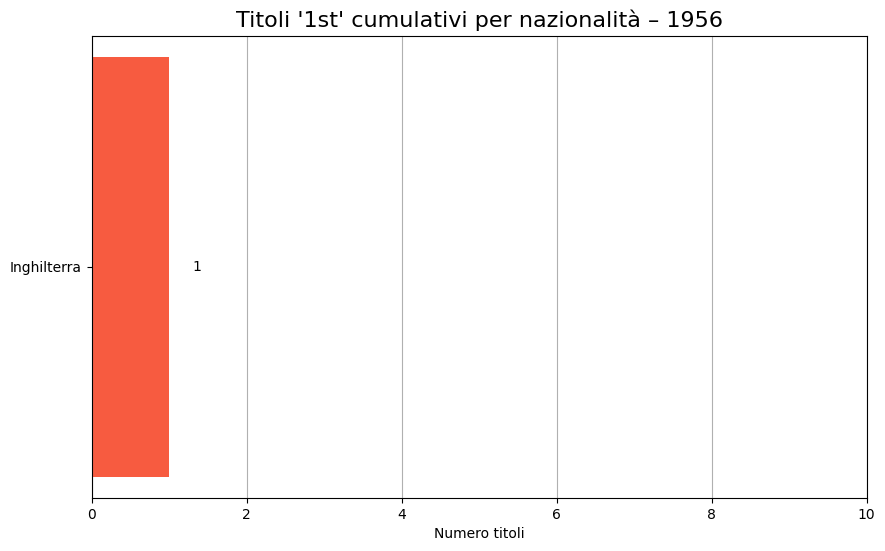

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.cm as cm
import numpy as np

df = pd.read_csv('../Dataset/dfPlayerFinal_2025.csv') 
df = df[["year", "nazionality", "rank"]]
df = df[df["rank"] == "1st"].copy()
df.sort_values("year", inplace=True)
df["Count"] = 1
df["Counter"] = df.groupby("nazionality")["Count"].cumsum()

cumulative = df.pivot_table(index="year", 
    columns="nazionality", 
    values="Counter", 
    aggfunc="max").fillna(method="ffill").fillna(0).astype(int)

active_nations = cumulative.max()[cumulative.max() > 0].index.tolist()
cumulative = cumulative[active_nations].copy()
all_years = pd.Series(range(cumulative.index.min(), cumulative.index.max() + 1), name="year")
cumulative = cumulative.reindex(all_years, method='ffill').fillna(0).astype(int).reset_index()

fig, ax = plt.subplots(figsize=(10, 6))
colors = plt.cm.tab20.colors
# Calcolo la prima apparizione per ogni nazione
first_year = df.groupby("nazionality")["year"].min()

# ---------- COLORAZIONE -------------
# Lista delle nazioni attive
old_nations = [n for n in active_nations if first_year[n] <= 1994]
new_nations = [n for n in active_nations if first_year[n] > 1994]
# Genera tonalità con le mappe colori
reds = cm.Reds(np.linspace(0.4, 0.9, len(old_nations)))   # tonalità rosse non troppo chiare
blues = cm.Blues(np.linspace(0.4, 0.9, len(new_nations))) # tonalità blu non troppo chiare
# Mappa nazione → colore
nation_color = {}
for nation, color in zip(old_nations, reds):
    nation_color[nation] = color
for nation, color in zip(new_nations, blues):
    nation_color[nation] = color

def update(year_idx):
    ax.clear()
    year = cumulative.loc[year_idx, "year"]
    data = cumulative.loc[year_idx].drop("year")
    
    visible = data[data > 0].index.tolist()
    data = data.loc[visible].sort_values(ascending=False)

    bars_colors = []
    for nation in data.index:
        if first_year[nation] <= 1994:
            color = adjust_luminosity(red, 1.0)  # Rosso normale o scuro
        else:
            color = adjust_luminosity(blue, 0.7)  # Blu più chiaro
        bars_colors.append(color)

    bars_colors = [nation_color[n] for n in data.index]
    bars = ax.barh(data.index[::-1], data.values[::-1], color=bars_colors[::-1])

    ax.set_title(f"Titoli '1st' cumulativi per nazionalità – {year}", fontsize=16)
    ax.set_xlim(0, cumulative.drop(columns="year").values.max() + 1)
    ax.set_xlabel("Numero titoli")
    ax.grid(True, axis='x')

    for bar in bars:
        ax.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
                f"{int(bar.get_width())}", va='center')

ani = FuncAnimation(fig, update, frames=len(cumulative), interval=800, repeat=False)
display(HTML(ani.to_jshtml()))

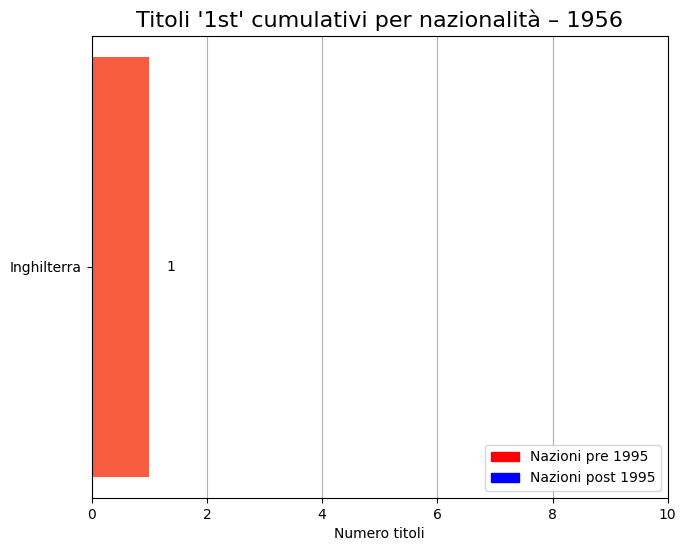

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.cm as cm
import numpy as np
from matplotlib.patches import Patch

df = pd.read_csv('../Dataset/dfPlayerFinal_2025.csv') 
df = df[["year", "nazionality", "rank"]]
df = df[df["rank"] == "1st"].copy()
df.sort_values("year", inplace=True)
df["Count"] = 1
df["Counter"] = df.groupby("nazionality")["Count"].cumsum()

cumulative = df.pivot_table(index="year", 
    columns="nazionality", 
    values="Counter", 
    aggfunc="max").ffill().fillna(0).astype(int)

active_nations = cumulative.max()[cumulative.max() > 0].index.tolist()
cumulative = cumulative[active_nations].copy()
all_years = pd.Series(range(cumulative.index.min(), cumulative.index.max() + 1), name="year")
cumulative = cumulative.reindex(all_years, method='ffill').fillna(0).astype(int).reset_index()

fig, ax = plt.subplots(figsize=(8, 6))
colors = plt.cm.tab20.colors
fig.subplots_adjust(left=0.18)  # aumenta lo spazio a sinistra
# Calcolo la prima apparizione per ogni nazione
first_year = df.groupby("nazionality")["year"].min()

# ---------- COLORAZIONE -------------
# Lista delle nazioni attive
old_nations = [n for n in active_nations if first_year[n] <= 1994]
new_nations = [n for n in active_nations if first_year[n] > 1994]
# Genera tonalità con le mappe colori
reds = cm.Reds(np.linspace(0.4, 0.9, len(old_nations)))   # tonalità rosse non troppo chiare
blues = cm.Blues(np.linspace(0.4, 0.9, len(new_nations))) # tonalità blu non troppo chiare
# Mappa nazione → colore
nation_color = {}
for nation, color in zip(old_nations, reds):
    nation_color[nation] = color
for nation, color in zip(new_nations, blues):
    nation_color[nation] = color

def update(year_idx):
    ax.clear()
    year = cumulative.loc[year_idx, "year"]
    data = cumulative.loc[year_idx].drop("year")
    
    visible = data[data > 0].index.tolist()
    data = data.loc[visible].sort_values(ascending=False)

    bars_colors = [nation_color[n] for n in data.index]
    bars = ax.barh(data.index[::-1], data.values[::-1], color=bars_colors[::-1])

    ax.set_title(f"Titoli '1st' cumulativi per nazionalità – {year}", fontsize=16)
    ax.set_xlim(0, cumulative.drop(columns="year").values.max() + 1)
    ax.set_xlabel("Numero titoli")
    ax.grid(True, axis='x')

    for bar in bars:
        ax.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
                f"{int(bar.get_width())}", va='center')
    
    leg = ax.get_legend()
    if leg:
        leg.remove()
    legend_handles = [
        Patch(color='red', label='Nazioni pre 1995'),
        Patch(color='blue', label='Nazioni post 1995')
    ]
    ax.legend(handles=legend_handles, loc='lower right')


ani = FuncAnimation(fig, update, frames=len(cumulative), interval=800, repeat=False)
display(HTML(ani.to_jshtml()))

ani.save('animation.html', writer='html')

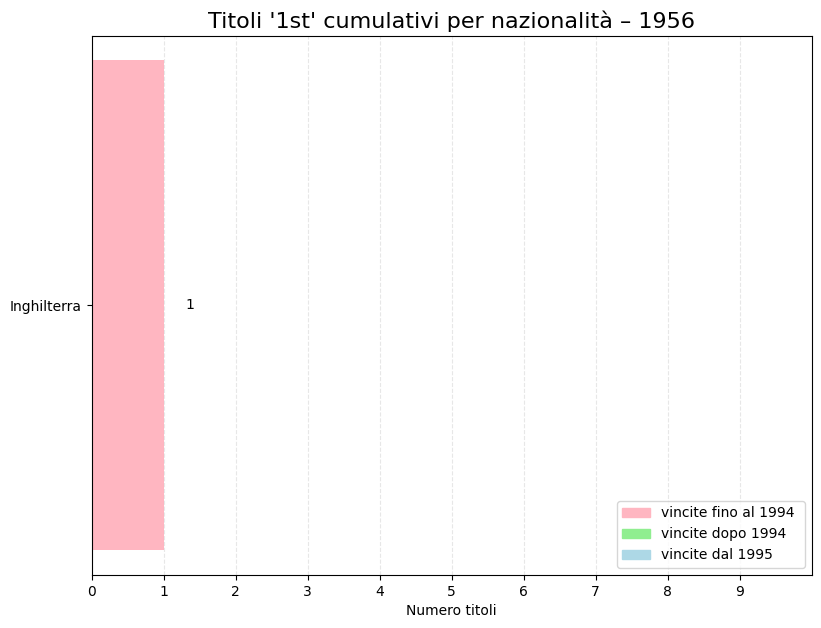

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.cm as cm
import numpy as np
from matplotlib.patches import Patch

df = pd.read_csv('../Dataset/dfPlayerFinal_2025.csv') 
df = df[["year", "nazionality", "rank"]]
df = df[df["rank"] == "1st"].copy()
df.sort_values("year", inplace=True)
df["Count"] = 1
df["Counter"] = df.groupby("nazionality")["Count"].cumsum()

cumulative = df.pivot_table(index="year", 
    columns="nazionality", 
    values="Counter", 
    aggfunc="max").ffill().fillna(0).astype(int)

active_nations = cumulative.max()[cumulative.max() > 0].index.tolist()
cumulative = cumulative[active_nations].copy()

all_years = pd.Series(range(cumulative.index.min(), cumulative.index.max() + 1), name="year")
cumulative = cumulative.reindex(all_years, method='ffill').fillna(0).astype(int).reset_index()

fig, ax = plt.subplots(figsize=(10, 7))
colors = plt.cm.tab20.colors
fig.subplots_adjust(left=0.18)

# Calcolo la prima apparizione per ogni nazione
first_year = df.groupby("nazionality")["year"].min()

# ---------- COLORAZIONE -------------
# Lista delle nazioni attive
old_nations = [n for n in active_nations if first_year[n] <= 1994]
new_nations = [n for n in active_nations if first_year[n] > 1994]

'''
# Forza la Grecia ad essere nelle nazioni "vecchie" (rosse)
if 'Croazia' in new_nations:
    new_nations.remove('Croazia')
    old_nations.append('Croazia')
'''

# Colori solidi senza sfumature
red_color = 'lightpink'
green_color = 'lightgreen'
blue_color = 'lightblue'

# Mappa nazione → colore (stesso colore per tutte le nazioni della stessa categoria)
nation_color_red = {}
nation_color_green = {}
nation_color_blue = {}

for nation in old_nations:
    nation_color_red[nation] = red_color
    nation_color_green[nation] = green_color

for nation in new_nations:
    nation_color_blue[nation] = blue_color

def get_nation_color(nation, year, count_1995):
    """
    Determina il colore di una nazione in base all'anno e ai conteggi
    - Nazioni pre-1995: rosse fino al 1995, poi verdi per nuovi conteggi, rosse per conteggi pre-1995
    - Nazioni post-1995: sempre blu
    """
    if nation in old_nations:
        if year <= 1995:
            return nation_color_red[nation]
        else:
            # Dopo il 1995, le nazioni vecchie diventano verdi
            return nation_color_green[nation]
    else:
        return nation_color_blue[nation]

def update(year_idx):
    ax.clear()
    year = cumulative.loc[year_idx, "year"]
    data = cumulative.loc[year_idx].drop("year")
    
    visible = data[data > 0].index.tolist()
    data = data.loc[visible].sort_values(ascending=False)
    
    # Calcola i conteggi al 1995 per ogni nazione
    if year >= 1995:
        idx_1995 = cumulative[cumulative["year"] == 1995].index[0]
        counts_1995 = cumulative.loc[idx_1995].drop("year")
    else:
        counts_1995 = pd.Series(0, index=data.index)
    
    # Crea le barre con colori appropriati
    bars_colors = []
    for nation in data.index:
        color = get_nation_color(nation, year, counts_1995.get(nation, 0))
        bars_colors.append(color)
    
    bars = ax.barh(data.index[::-1], data.values[::-1], color=bars_colors[::-1])
    
    # Se siamo dopo il 1995, aggiungi le barre rosse per i conteggi pre-1995 delle nazioni vecchie
    if year > 1995:
        for i, nation in enumerate(data.index[::-1]):
            if nation in old_nations:
                count_1995 = counts_1995.get(nation, 0)
                if count_1995 > 0:
                    # Barra rossa sovrapposta per i conteggi del 1995
                    ax.barh(nation, count_1995, color=nation_color_red[nation], alpha=0.8)
    
    ax.set_title(f"Titoli '1st' cumulativi per nazionalità – {year}", fontsize=16)
    ax.set_xlim(0, cumulative.drop(columns="year").values.max() + 1)
    ax.set_xlabel("Numero titoli")
    # Aggiungi griglia per migliorare la leggibilità
    ax.set_xticks(np.arange(0, 10, 1))
    ax.grid(True, axis='x', alpha=0.3, linestyle='--')
    
    # Aggiungi testo con i valori
    for bar in bars:
        ax.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
                f"{int(bar.get_width())}", va='center')
    
    # Rimuovi eventuali leggende esistenti
    leg = ax.get_legend()
    if leg:
        leg.remove()
    
    # Crea le 3 leggende
    legend_handles = [
        Patch(color='lightpink', label='vincite fino al 1994 '),
        Patch(color='lightgreen', label='vincite dopo 1994'),
        Patch(color='lightblue', label='vincite dal 1995')
    ]
    ax.legend(handles=legend_handles, loc='lower right')

ani = FuncAnimation(fig, update, frames=len(cumulative), interval=700, repeat=False)
display(HTML(ani.to_jshtml()))
ani.save('animation.html', writer='html')